In [1]:
import os

from astropy.io import fits
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import Image

from exotedrf import utils, stage1, stage2
from exotedrf.extra_functions import download_observations

os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [2]:
# download_observations(proposal_id='2734', objectname='WASP-96b', instrument_name='NIRISS/SOSS',
#                       filters=['CLEAR', 'F277W'])

In [2]:
def plot_spectrum(path, vmin=1e4, vmax=3e4):
    with fits.open(path) as file:
        plt.figure(figsize=(8, 3))
        plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
                   vmin=vmin, vmax=vmax)
        plt.show()
    return path

In [3]:
# Generate output directories
utils.verify_path('/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2')

In [4]:
# First define some input and output directory paths.

uncal_indir = '/data/typhon2/hattie/jwst/wasp_96/DMS_uncal/'  # Where our uncalibrated files are found.
outdir_s1 = '/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/'  # Where to save our Stage 1 output files.

In [5]:
filenames = [uncal_indir+'jw02734002001_04101_00001-seg001_nis_uncal.fits',
             uncal_indir+'jw02734002001_04101_00001-seg002_nis_uncal.fits',
             uncal_indir+'jw02734002001_04101_00001-seg003_nis_uncal.fits',]

In [7]:
with fits.open(filenames[0]) as file:
    print('No. integrations: {}'.format(file[0].header['NINTS']))
    print('No. groups: {}'.format(file[0].header['NGROUPS']))
    print('subarray: {}'.format(file[0].header['SUBARRAY']))



No. integrations: 280
No. groups: 14
subarray: SUBSTRIP256


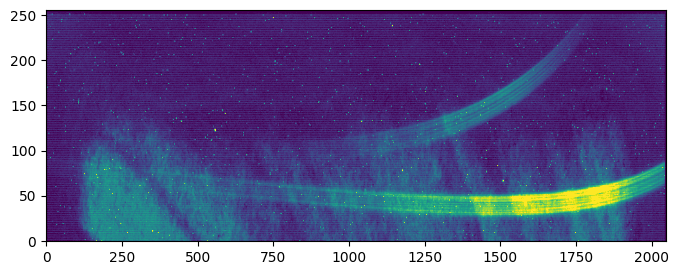

In [8]:


with fits.open(filenames[0]) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [9]:
step = stage1.DQInitStep(filenames, deepframe=None, output_dir=outdir_s1)

# Now run the step!

results = step.run(save_results=True, force_redo=True)

2024-09-11 14:51:05,431 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2024-09-11 14:51:06,602 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2024-09-11 14:51:06,731 - stpipe.DQInitStep - INFO - Step DQInitStep running with args (<Level1bModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_uncal.fits>,).
2024-09-11 14:51:06,734 - stpipe.DQInitStep - INFO - Step DQInitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2024-09-11 14:51:07,154 - stpipe.DQInitStep - INFO - Using MASK reference file ./crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits
2024-09-11 14:51:08,021 - stpipe.DQInitStep - INFO - Extracting mask subarray to match science data
2024-09-11 14:51:08,773 - stpi

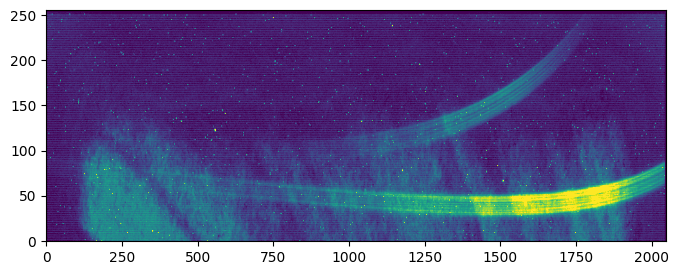

In [10]:

with fits.open(os.path.join(outdir_s1, "jw02734002001_04101_00001-seg001_nis_dqinitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [11]:

step = stage1.SaturationStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2024-09-11 14:51:37,275 - stpipe.SaturationStep - INFO - SaturationStep instance created.


2024-09-11 14:51:37,295 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2024-09-11 14:51:37,409 - stpipe.SaturationStep - INFO - Step SaturationStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_dqinitstep.fits>,).
2024-09-11 14:51:37,412 - stpipe.SaturationStep - INFO - Step SaturationStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  n_pix_grow_sat: 1
2024-09-11 14:51:37,447 - stpipe.SaturationStep - INFO - Using SATURATION reference file ./crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits
2024-09-11 14:51:37,518 - stpipe.SaturationStep - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored
2024-0

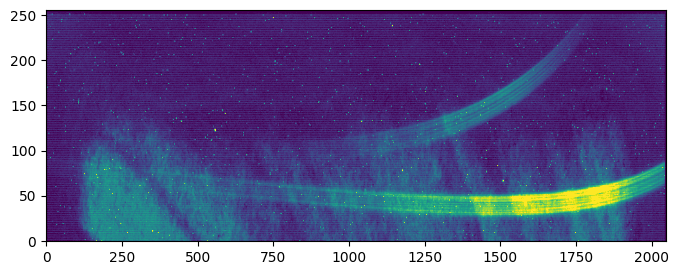

In [12]:

with fits.open(os.path.join(outdir_s1, "jw02734002001_04101_00001-seg001_nis_saturationstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [13]:
saturation_step_files = [outdir_s1 + "jw02734002001_04101_00001-seg001_nis_saturationstep.fits",
                         outdir_s1 + "jw02734002001_04101_00001-seg002_nis_saturationstep.fits",
                         outdir_s1 + "jw02734002001_04101_00001-seg003_nis_saturationstep.fits"]

step = stage1.SuperBiasStep(saturation_step_files, output_dir=outdir_s1)

# This step has options for diagnostic plotting. Specifying do_plot=True will create the step
# plot and save it to the output directory.

results = step.run(save_results=True, force_redo=True, do_plot=True)

2024-09-11 14:53:17,029 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2024-09-11 14:53:17,051 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2024-09-11 14:53:17,169 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_saturationstep.fits>,).
2024-09-11 14:53:17,172 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2024-09-11 14:53:17,207 - stpipe.SuperBiasStep - INFO - Using SUPERBIAS reference file ./crds_cache/references/jwst/niriss/jwst_niriss_superbias_0200.fits
2024-09-11 14:53:18,822 - stpipe.SuperBiasStep - INFO - Results used CRDS context: jwst

2024-09-11 14:53:51.825 - exoTEDRF - INFO - Doing diagnostic plot.
2024-09-11 14:53:55.116 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/superbiasstep.png


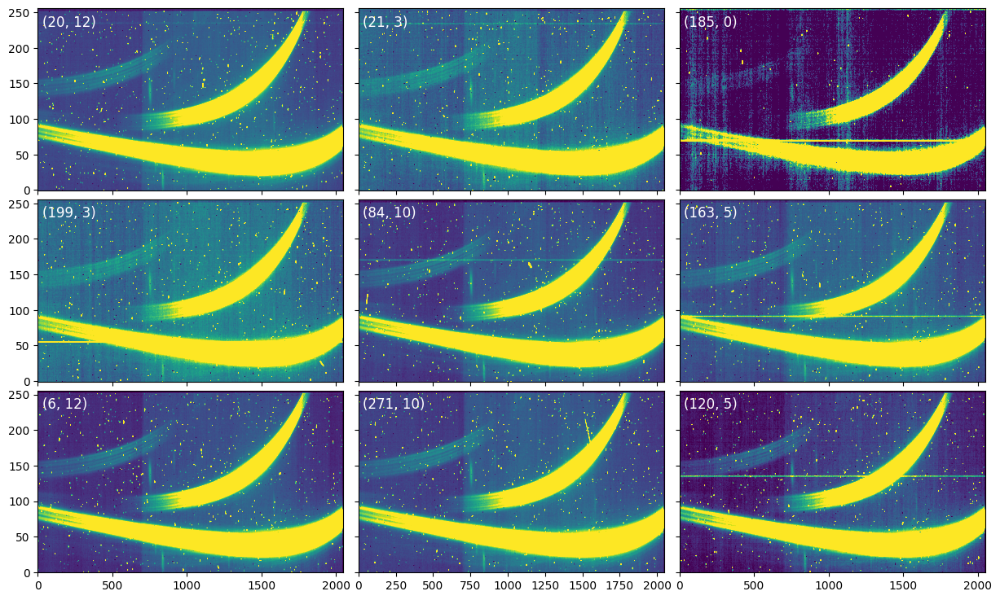

In [14]:
Image(filename=outdir_s1 + 'superbiasstep.png')

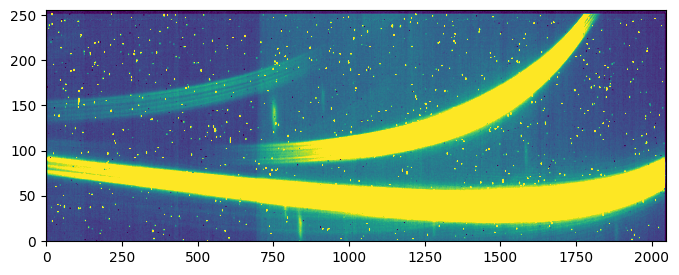

In [15]:
with fits.open(os.path.join(outdir_s1, "jw02734002001_04101_00001-seg001_nis_superbiasstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [16]:
step = stage1.RefPixStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2024-09-11 14:53:55,453 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2024-09-11 14:53:55,474 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2024-09-11 14:53:55,604 - stpipe.RefPixStep - INFO - Step RefPixStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_superbiasstep.fits>,).
2024-09-11 14:53:55,607 - stpipe.RefPixStep - INFO - Step RefPixStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  odd_even_columns: True
  use_side_ref_pixels: True
  side_smoothing_length: 11
  side_gain: 1.0
  odd_even_rows: True
  ovr_corr_mitigation_ftr: 3.0


2024-09-11 14:53:56,515 - stpipe.RefPixStep - INFO - NIR subarray data
2024-09-11 14:53:56,518 - stpipe.RefPixStep - INFO - Single readout amplifier used
2024-09-11 14:53:56,519 - stpipe.RefPixStep - INFO - The following parameter is valid for this mode:
2024-09-11 14:53:56,519 - stpipe.RefPixStep - INFO - odd_even_columns = True
2024-09-11 14:53:56,520 - stpipe.RefPixStep - INFO - The following parameters are not applicable and are ignored:
2024-09-11 14:53:56,520 - stpipe.RefPixStep - INFO - use_side_ref_pixels = True
2024-09-11 14:53:56,521 - stpipe.RefPixStep - INFO - side_smoothing_length = 11
2024-09-11 14:53:56,521 - stpipe.RefPixStep - INFO - side_gain = 1.0
2024-09-11 14:53:56,522 - stpipe.RefPixStep - INFO - odd_even_rows = False
2024-09-11 14:54:10,513 - stpipe.RefPixStep - INFO - Saved model in /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/jw02734002001_04101_00001-seg001_nis_refpixstep.fits
2024-09-11 14:54:10,514 - stpipe.RefPixStep - INFO - Step Ref

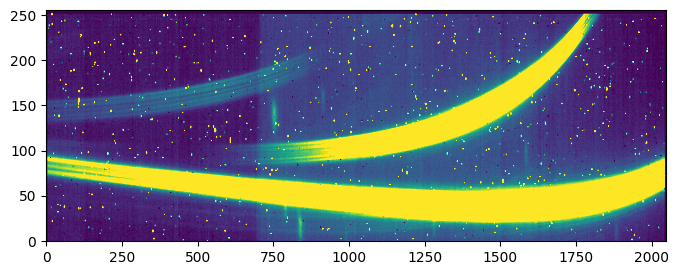

In [17]:
with fits.open(os.path.join(outdir_s1, "jw02734002001_04101_00001-seg001_nis_refpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [18]:
step = stage1.DarkCurrentStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2024-09-11 14:54:37,804 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2024-09-11 14:54:37,824 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.
2024-09-11 14:54:37,825 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2024-09-11 14:54:37,945 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_refpixstep.fits>,).
2024-09-11 14:54:37,947 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  dark_output: None


2024-09-11 14:54:37,983 - stpipe.DarkCurrentStep - INFO - Using DARK reference file ./crds_cache/references/jwst/niriss/jwst_niriss_dark_0171.fits
2024-09-11 14:54:38,105 - stpipe.DarkCurrentStep - INFO - Science data nints=100, ngroups=14, nframes=1, groupgap=0
2024-09-11 14:54:38,106 - stpipe.DarkCurrentStep - INFO - Dark data nints=1, ngroups=50, nframes=1, groupgap=0
2024-09-11 14:54:40,583 - stpipe.DarkCurrentStep - INFO - Results used CRDS context: jwst_1276.pmap
2024-09-11 14:54:48,475 - stpipe.DarkCurrentStep - INFO - Saved model in /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/jw02734002001_04101_00001-seg001_nis_darkcurrentstep.fits
2024-09-11 14:54:48,476 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep done
2024-09-11 14:54:48,477 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2024-09-11 14:54:48,497 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.
2024-09-11 14:54:48,498 - st

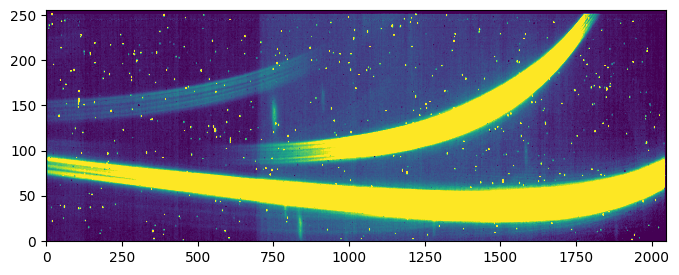

'/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/jw02734002001_04101_00001-seg001_nis_darkcurrentstep.fits'

In [19]:
plot_spectrum(os.path.join(outdir_s1, "jw02734002001_04101_00001-seg001_nis_darkcurrentstep.fits"), vmin=1e2, vmax=9e2)

In [12]:
background_model = np.load('model_background256.npy')

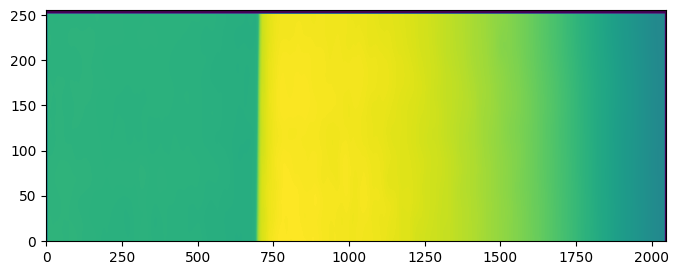

In [21]:
plt.figure(figsize=(8, 3))
plt.imshow(background_model, aspect='auto', origin='lower')
plt.show()

In [22]:
step = stage2.BackgroundStep(results, background_model=background_model,
                             baseline_ints=[150, -100], output_dir=outdir_s1)

results, bkg = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)


2024-09-11 14:55:08.380 - exoTEDRF - INFO - BackgroundStep instance created.
2024-09-11 14:55:08.380 - exoTEDRF - INFO - Starting background subtraction step.
2024-09-11 14:55:10.223 - exoTEDRF - INFO - Generating a median stack using baseline integrations.
2024-09-11 14:58:20.735 - exoTEDRF - INFO - Calculating background model scaling.
2024-09-11 14:58:20.741 - exoTEDRF - INFO - Using differential background scale factors: 0.00065, 0.38317, and shift: 18.56030
2024-09-11 14:58:20.747 - exoTEDRF - INFO - Using differential background scale factors: 0.00032, 1.41201, and shift: 6.33440
2024-09-11 14:58:20.753 - exoTEDRF - INFO - Using differential background scale factors: 1.19749, 3.05157, and shift: 0.00000
2024-09-11 14:58:20.759 - exoTEDRF - INFO - Using differential background scale factors: 3.67823, 5.50303, and shift: 0.00000
2024-09-11 14:58:20.764 - exoTEDRF - INFO - Using differential background scale factors: 6.25121, 7.89411, and shift: 0.00000
2024-09-11 14:58:20.770 - exo

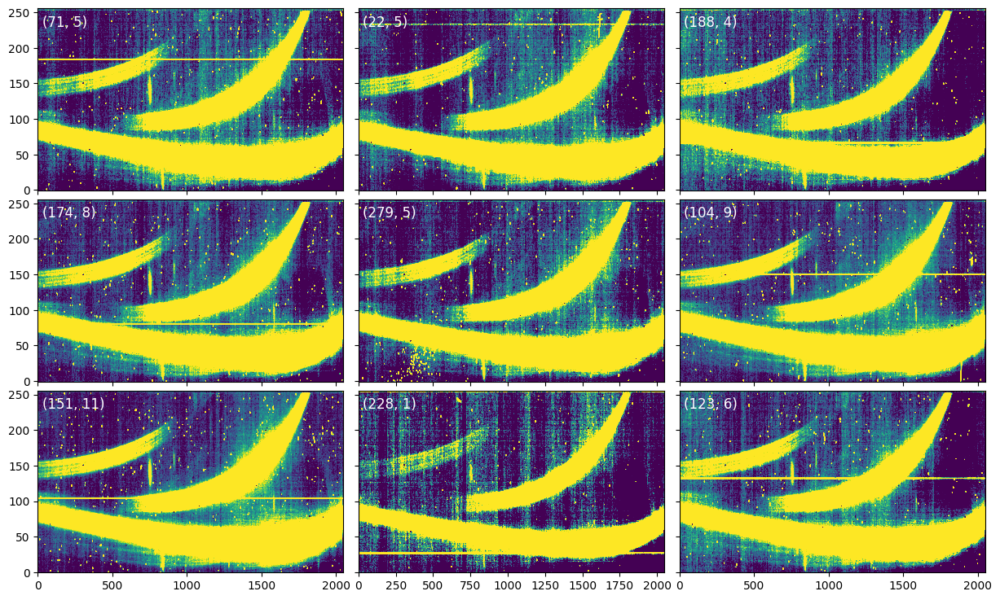

In [23]:
Image(filename=outdir_s1 + 'backgroundstep_1.png')

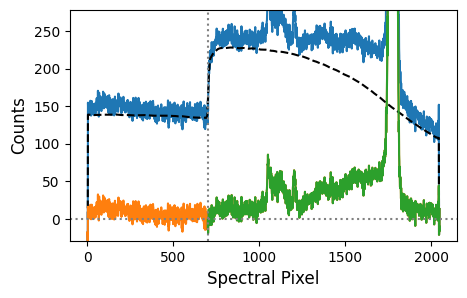

In [24]:
Image(filename=outdir_s1 + 'backgroundstep_2.png')



In [25]:
pixel_masks = None
timeseries = None
step = stage1.OneOverFStep(results, baseline_ints=[150, -100], output_dir=outdir_s1,
                           pixel_masks=pixel_masks, soss_timeseries=timeseries,
                           method='scale-achromatic', soss_background=bkg)
results = step.run(save_results=True, even_odd_rows=True, force_redo=True, do_plot=True,
                   soss_inner_mask_width=40)

2024-09-11 14:58:57.302 - exoTEDRF - INFO - OneOverFStep instance created.
2024-09-11 14:58:57.303 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2024-09-11 14:58:59.148 - exoTEDRF - INFO - Generating a deep stack for each group using baseline integrations.


2024-09-11 15:02:09,695 - stpipe.Extract1dStep - INFO - Extract1dStep instance created.
2024-09-11 15:02:09,735 - CRDS - INFO -  Fetching  ./crds_cache/references/jwst/niriss/jwst_niriss_spectrace_0023.fits  616.3 K bytes  (1 / 1 files) (0 / 616.3 K bytes)


2024-09-11 15:02:09.692 - exoTEDRF - INFO - No centroids provided, locating trace positions.
2024-09-11 15:02:11.287 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2024-09-11 15:02:11.435 - exoTEDRF - INFO - Constructing trace mask.
2024-09-11 15:02:11.600 - exoTEDRF - INFO - Flagging additional outliers.
2024-09-11 15:03:56.526 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2024-09-11 15:03:57.596 - exoTEDRF - INFO - Starting full frame correction.


100%|██████████| 280/280 [00:35<00:00,  7.89it/s]


2024-09-11 15:04:55.030 - exoTEDRF - INFO - Doing diagnostic plot 1.
2024-09-11 15:08:19.204 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/oneoverfstep_1.png
2024-09-11 15:08:19.220 - exoTEDRF - INFO - Doing diagnostic plot 2.


100%|██████████| 25/25 [01:56<00:00,  4.67s/it]


2024-09-11 15:17:39.661 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/oneoverfstep_2.png
2024-09-11 15:17:39.661 - exoTEDRF - INFO - Step OneOverFStep done.


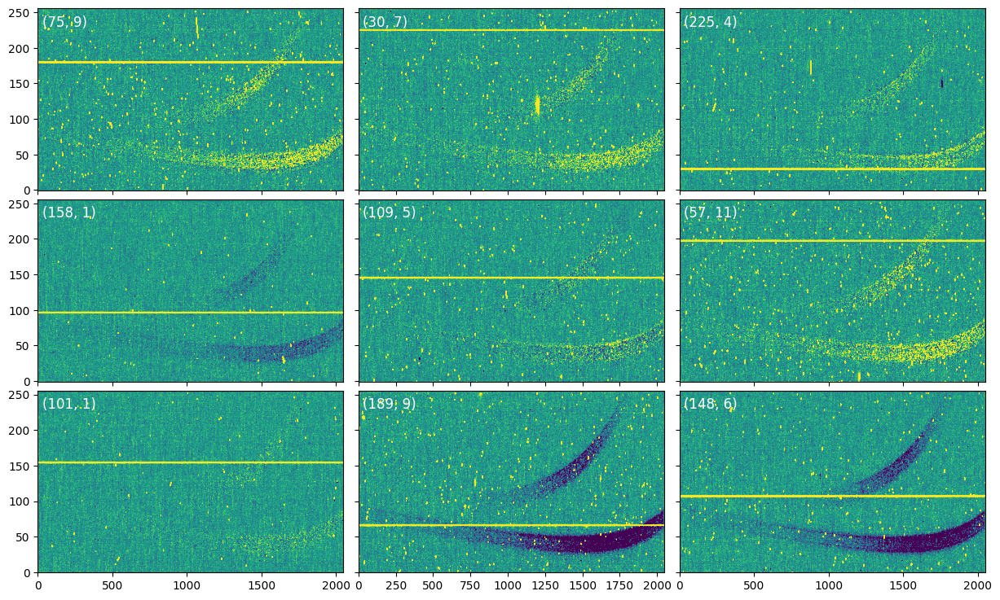

In [26]:
Image(filename=outdir_s1 + 'oneoverfstep_1.png')



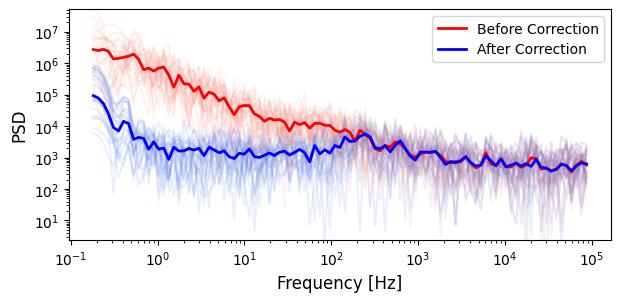

In [27]:
Image(filename=outdir_s1 + 'oneoverfstep_2.png')


In [28]:
step = stage1.LinearityStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

2024-09-11 15:17:39,752 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2024-09-11 15:17:39,773 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2024-09-11 15:17:40,007 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_oneoverfstep.fits>,).
2024-09-11 15:17:40,009 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2024-09-11 15:17:40,045 - CRDS - INFO -  Fetching  ./crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits  205.5 M bytes  (1 / 1 files) (0 / 205.5 M bytes)
2024-09-11 15:17:47,094 - stpipe.LinearityStep - INFO - Using Linearity ref

2024-09-11 15:18:28.192 - exoTEDRF - INFO - Doing diagnostic plot 1.
2024-09-11 15:18:33.786 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/linearitystep_1.png
2024-09-11 15:18:33.815 - exoTEDRF - INFO - Doing diagnostic plot 2.
2024-09-11 15:18:53.910 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/linearitystep_2.png


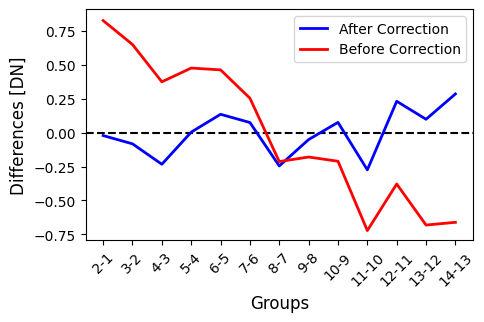

In [29]:
Image(filename=outdir_s1 + 'linearitystep_1.png')



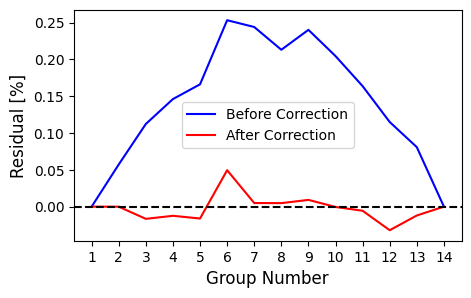

In [30]:
Image(filename=outdir_s1 + 'linearitystep_2.png')



In [31]:
step = stage1.JumpStep(results, output_dir=outdir_s1)
results = step.run(save_results=True, force_redo=True, flag_in_time=True,
                   time_rejection_threshold=7, do_plot=True)

2024-09-11 15:18:54.030 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 14/14 [21:58<00:00, 94.17s/it]


2024-09-11 15:40:52.440 - exoTEDRF - INFO - 1706951 jumps flagged
2024-09-11 15:40:52.440 - exoTEDRF - INFO - and 0 interpolated
2024-09-11 15:40:58.289 - exoTEDRF - INFO - Done
2024-09-11 15:40:58.310 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 14/14 [22:34<00:00, 96.77s/it]


2024-09-11 16:03:33.132 - exoTEDRF - INFO - 1723675 jumps flagged
2024-09-11 16:03:33.132 - exoTEDRF - INFO - and 0 interpolated
2024-09-11 16:03:38.959 - exoTEDRF - INFO - Done
2024-09-11 16:03:38.980 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 14/14 [17:45<00:00, 76.10s/it]


2024-09-11 16:21:24.371 - exoTEDRF - INFO - 1379739 jumps flagged
2024-09-11 16:21:24.371 - exoTEDRF - INFO - and 0 interpolated
2024-09-11 16:21:29.081 - exoTEDRF - INFO - Done
2024-09-11 16:21:29.084 - exoTEDRF - INFO - Doing diagnostic plot.
2024-09-11 16:22:46.902 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/jump.png
2024-09-11 16:22:46.922 - exoTEDRF - INFO - Step JumpStep done.


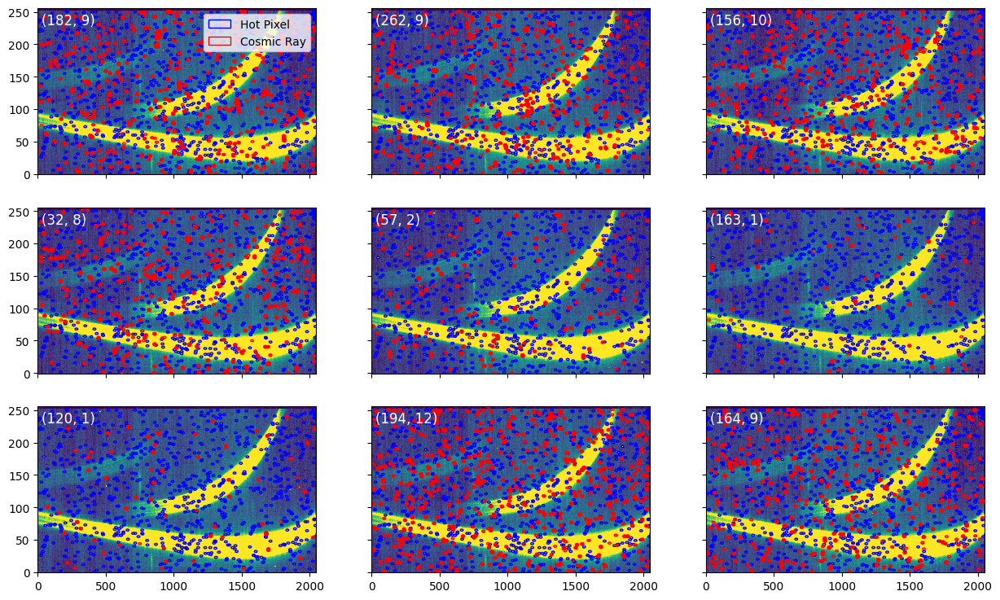

In [32]:
Image(filename=outdir_s1 + 'jump.png')

In [33]:
step = stage1.RampFitStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2024-09-11 16:22:47,087 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2024-09-11 16:22:47,106 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2024-09-11 16:22:48,358 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_jump.fits>,).
2024-09-11 16:22:48,361 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2024-09-11 16:22:48,397 - CRDS - INFO -  Fetching  ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits   16.8 M bytes  (1 / 1 files) (0 / 16.8 M bytes)


2024-09-11 16:23:35.953 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2024-09-11 16:24:27,360 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2024-09-11 16:24:27,381 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2024-09-11 16:24:27,527 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg002_nis_jump.fits>,).
2024-09-11 16:24:27,530 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2024-09-11 16:24:27,584 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2024-09-11 16:

2024-09-11 16:25:13.201 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2024-09-11 16:26:04,738 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2024-09-11 16:26:04,758 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2024-09-11 16:26:04,906 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(80, 14, 256, 2048) from jw02734002001_04101_00001-seg003_nis_jump.fits>,).
2024-09-11 16:26:04,909 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2024-09-11 16:26:04,962 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2024-09-11 16:2

2024-09-11 16:26:42.191 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.
2024-09-11 16:27:23.527 - exoTEDRF - INFO - Step RampFitStep really done.


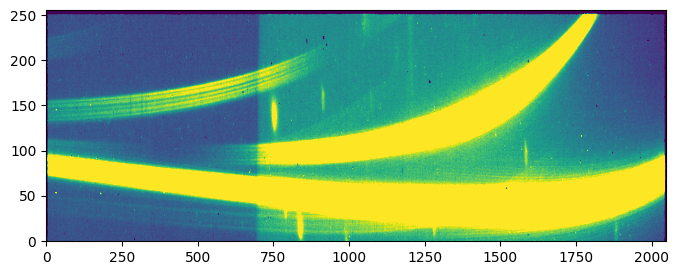

In [60]:
with fits.open(os.path.join(outdir_s1, "jw02734002001_04101_00001-seg003_nis_rampfitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=6)
    plt.show()

In [34]:
step = stage1.GainScaleStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)



2024-09-11 16:27:23,577 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2024-09-11 16:27:23,595 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2024-09-11 16:27:23,744 - stpipe.GainScaleStep - INFO - Step GainScaleStep running with args (<CubeModel(100, 256, 2048) from jw02734002001_04101_00001-seg001_nis_rampfitstep.fits>,).
2024-09-11 16:27:23,747 - stpipe.GainScaleStep - INFO - Step GainScaleStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2024-09-11 16:27:23,824 - stpipe.GainScaleStep - INFO - GAINFACT not found in gain reference file
2024-09-11 16:27:23,825 - stpipe.GainScaleStep - INFO - Step will be skipped
2024-09-11 16:27:23,835 - stpipe.GainScaleStep - INFO - Results used CRDS 

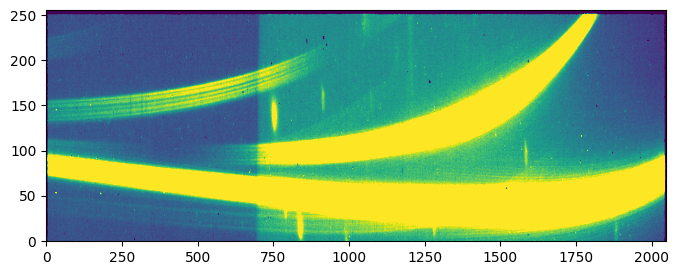

In [59]:
with fits.open(os.path.join(outdir_s1, "jw02734002001_04101_00001-seg003_nis_gainscalestep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=6)
    plt.show()

In [7]:
outdir_s2 = "/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/"

In [8]:
gain_scale_filenames = [outdir_s1 + "jw02734002001_04101_00001-seg001_nis_gainscalestep.fits",
                        outdir_s1 + "jw02734002001_04101_00001-seg002_nis_gainscalestep.fits",
                        outdir_s1 + "jw02734002001_04101_00001-seg003_nis_gainscalestep.fits"]

step = stage2.AssignWCSStep(gain_scale_filenames, output_dir=outdir_s2)

results = step.run(save_results=True, force_redo=True)

2024-09-12 11:56:52,992 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.
2024-09-12 11:56:54,760 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nirspec_pathloss_0007.rmap    1.1 K bytes  (1 / 12 files) (0 / 89.3 K bytes)
2024-09-12 11:56:55,091 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nirspec_0379.imap          5.6 K bytes  (2 / 12 files) (1.1 K / 89.3 K bytes)
2024-09-12 11:56:55,484 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_trapdensity_0005.rmap      705 bytes  (3 / 12 files) (6.7 K / 89.3 K bytes)
2024-09-12 11:56:55,857 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_persat_0007.rmap      674 bytes  (4 / 12 files) (7.4 K / 89.3 K bytes)
2024-09-12 11:56:56,188 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_0256.imap           5.6 K bytes  (5 / 12 files) (8.1 K / 89.3 K bytes)
2024-09-12 11:56:56,484 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nircam_flat_0027.rma

In [9]:
step = stage2.SourceTypeStep(results, output_dir=outdir_s2)

results = step.run(save_results=True, force_redo=True)

2024-09-12 11:57:06,321 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2024-09-12 11:57:06,338 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.
2024-09-12 11:57:06,461 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<CubeModel(100, 256, 2048) from jw02734002001_04101_00001-seg001_nis_assignwcsstep.fits>,).
2024-09-12 11:57:06,463 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  source_type: None
2024-09-12 11:57:06,478 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NIS_SOSS
2024-09-12 11:57:06,478 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = POINT
2024-09-12 11:57:06,479 - stpipe.SourceTypeStep - INFO - Input is a TSO exposure; setting SRCTYPE = POINT
2024-09-12 11:57:08,001 - stpipe.Source

In [10]:
step = stage2.FlatFieldStep(results, output_dir=outdir_s2)

results = step.run(save_results=True, force_redo=True)



2024-09-12 11:57:11,128 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.
2024-09-12 11:57:11,145 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.
2024-09-12 11:57:11,270 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<CubeModel(100, 256, 2048) from jw02734002001_04101_00001-seg001_nis_sourcetypestep.fits>,).
2024-09-12 11:57:11,273 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_interpolated_flat: False
  user_supplied_flat: None
  inverse: False
2024-09-12 11:57:11,481 - stpipe.FlatFieldStep - INFO - Using FLAT reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_flat_0275.fits
2024-09-12 11:57:11,481 

In [13]:
step = stage2.BackgroundStep(results, background_model=background_model,
                             baseline_ints=[150, -100], output_dir=outdir_s2)

results = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)[0]


2024-09-12 11:59:42.885 - exoTEDRF - INFO - BackgroundStep instance created.
2024-09-12 11:59:44.283 - exoTEDRF - INFO - Starting background subtraction step.
2024-09-12 11:59:44.479 - exoTEDRF - INFO - Generating a median stack using baseline integrations.
2024-09-12 11:59:58.100 - exoTEDRF - INFO - Calculating background model scaling.
2024-09-12 11:59:58.101 - exoTEDRF - INFO - Using differential background scale factors: 0.43873, 0.44906, and shift: 0.00000
2024-09-12 12:00:04.324 - exoTEDRF - INFO - Doing diagnostic plot.
2024-09-12 12:00:05.895 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/backgroundstep_1.png
2024-09-12 12:00:30.380 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/backgroundstep_2.png
2024-09-12 12:00:30.380 - exoTEDRF - INFO - Step BackgroundStep done.


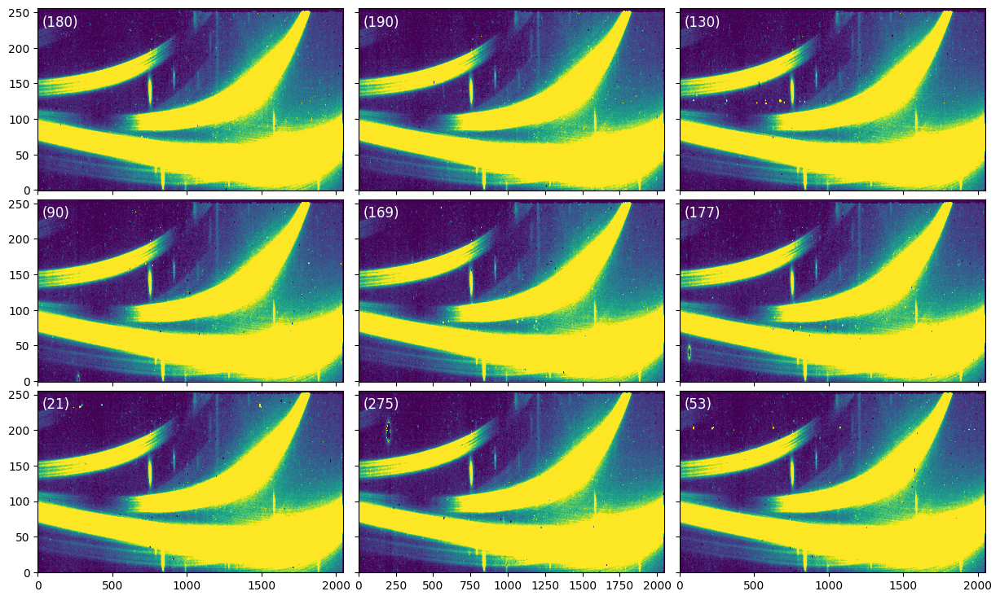

In [14]:
Image(filename=outdir_s2 + 'backgroundstep_1.png')

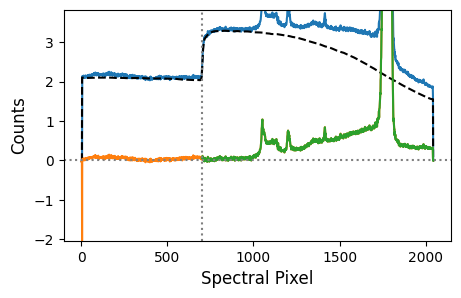

In [15]:


Image(filename=outdir_s2 + 'backgroundstep_2.png')



In [16]:
step = stage2.BadPixStep(results, baseline_ints=[150, -100], output_dir=outdir_s2)
results, deepframe = step.run(save_results=True, force_redo=True, do_plot=True,
                              space_thresh=10, time_thresh=10)

2024-09-12 12:00:30.519 - exoTEDRF - INFO - BadPixStep instance created.


2024-09-12 12:00:32.077 - exoTEDRF - INFO - Starting outlier pixel interpolation step.
2024-09-12 12:00:32.632 - exoTEDRF - INFO - Starting spatial outlier flagging...


100%|██████████| 2038/2038 [00:38<00:00, 52.70it/s]


2024-09-12 12:01:25.741 - exoTEDRF - INFO - 3769 hot, 0 nan, and 730 deviant pixels identified.
2024-09-12 12:01:25.741 - exoTEDRF - INFO - Doing pixel replacement...


100%|██████████| 280/280 [03:05<00:00,  1.51it/s]


2024-09-12 12:04:30.824 - exoTEDRF - INFO - Starting temporal outlier flagging...
2024-09-12 12:05:26.508 - exoTEDRF - INFO - 137639 outliers detected.
2024-09-12 12:05:26.508 - exoTEDRF - INFO - Doing pixel replacement...
2024-09-12 12:05:47.191 - exoTEDRF - INFO - Doing diagnostic plot.
2024-09-12 12:06:00.546 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/badpixstep.png
2024-09-12 12:06:01.275 - exoTEDRF - INFO - Step BadPixStep done.


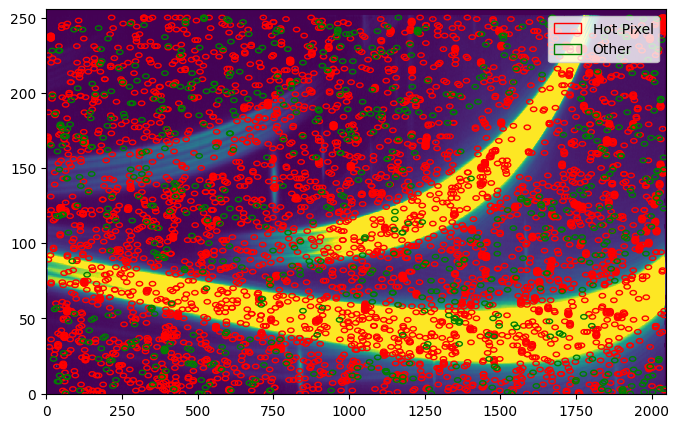

In [17]:
Image(filename=outdir_s2 + 'badpixstep.png')

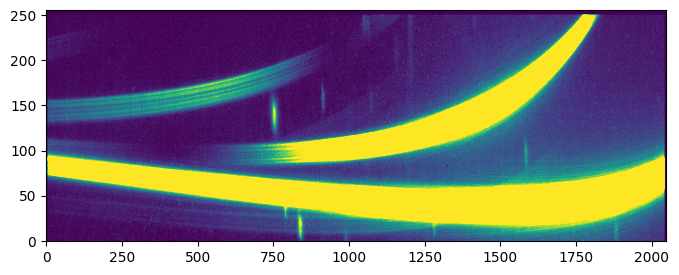

In [31]:
with fits.open(os.path.join(outdir_s2, "jw02734002001_04101_00001-seg003_nis_badpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[79], aspect='auto', origin='lower', vmin=0, vmax=5)
    plt.show()

In [33]:
pixel_masks = [outdir_s1 + 'jw02734002001_04101_00001-seg001_nis_pixelflags.fits',
                outdir_s1 + 'jw02734002001_04101_00001-seg002_nis_pixelflags.fits',
                outdir_s1 + 'jw02734002001_04101_00001-seg003_nis_pixelflags.fits']

step = stage2.TracingStep(results, deepframe=deepframe, generate_order0_mask=False,
                          calculate_stability=True, generate_lc=True, baseline_ints=[150, -100],
                          output_dir=outdir_s2)

step_results = step.run(pixel_flags=pixel_masks, save_results=True, force_redo=True,
                        do_plot=True)

centroids = step_results[0]

2024-09-12 12:28:05.288 - exoTEDRF - INFO - TracingStep instance created.
2024-09-12 12:28:05.288 - exoTEDRF - INFO - Starting Tracing Step.


2024-09-12 12:28:20,517 - stpipe.Extract1dStep - INFO - Extract1dStep instance created.


2024-09-12 12:28:20.500 - exoTEDRF - INFO - Finding trace centroids.
2024-09-12 12:28:21.173 - exoTEDRF - INFO - Centroids saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/jw02734002001_04101_00001_nis_centroids.csv
2024-09-12 12:28:21.173 - exoTEDRF - INFO - Calculating trace stability using the PCA method...
2024-09-12 12:28:24.191 - exoTEDRF - INFO - Plotting PCA outputs.
2024-09-12 12:28:26.898 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/stability_pca.png
2024-09-12 12:28:26.903 - exoTEDRF - INFO - Generating a smoothed light curve
2024-09-12 12:28:26.905 - exoTEDRF - INFO - Smoothed light curve saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/jw02734002001_04101_00001_nis_lcestimate.npy
2024-09-12 12:28:26.906 - exoTEDRF - INFO - Step TracingStep done.


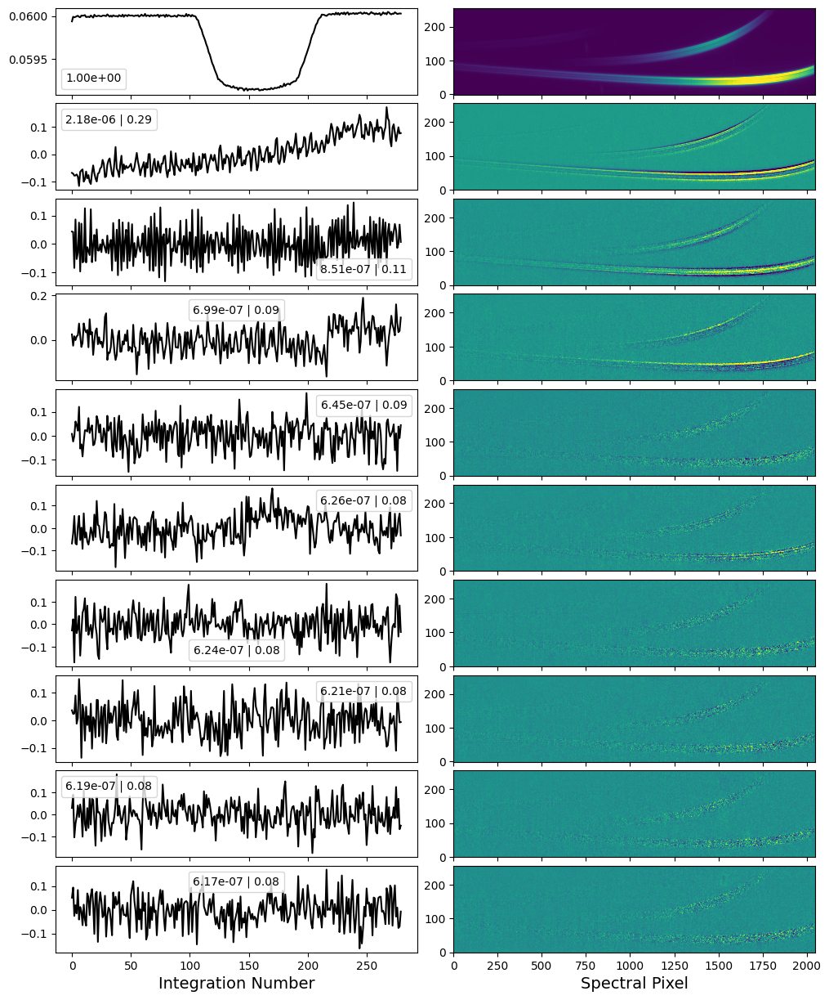

In [34]:
Image(filename=outdir_s2 + 'stability_pca.png')

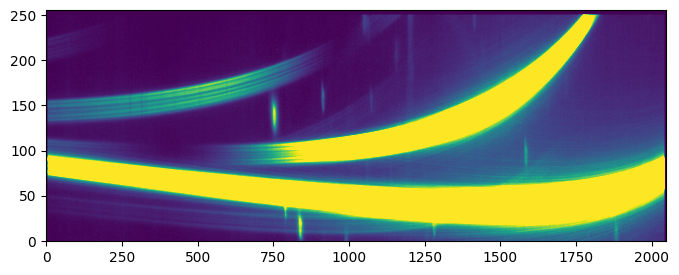

In [39]:
# calculate median value array of all arrays in first fits file using badpixstep as input
with fits.open(os.path.join(outdir_s2, "jw02734002001_04101_00001-seg003_nis_badpixstep.fits")) as file:
    median = np.median(file[1].data, axis=0)

# plot the median value array
plt.figure(figsize=(8, 3))
plt.imshow(median, aspect='auto', origin='lower', vmin=0, vmax=5)
plt.show()


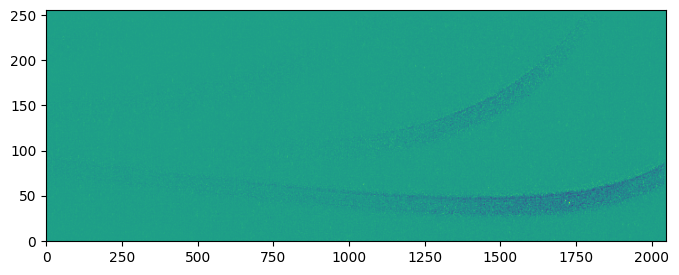

In [41]:
# subtract median from 1st integration in 1st image
with fits.open(os.path.join(outdir_s2, "jw02734002001_04101_00001-seg003_nis_badpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0] - median, aspect='auto', origin='lower', vmax=5)
    plt.show()